# LoRA editing with SAE latent

In [1]:
path = "weights2weights/weights_datasets"
device = "cuda"

In [2]:
import os
from copy import deepcopy

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from safetensors.torch import load_file
from sae.sae import EncoderOutput


Triton not installed, using eager implementation of SAE decoder.


### Check activations
In order to see which dimensions in latent space could be responsible for hair color: 
1. Get sample of blondes and sample of blacks - DONE
2. Save separate datasets - DONE
3. Pass through sae
4. Get histogram of latent features (sorted)
5. Choose high for blondes but low for blacks
6. Edit those 


In [3]:
blondes = torch.load(f"{path}/blondes.pt")
brunettes = torch.load(f"{path}/brunettes.pt")

In [4]:
from sae import Sae
# sae_path = "runs/test1/0"
# sae_path = "runs/run_lat5000_bs256_auxk0.03_k1000/0"
sae_path = "runs/test_feature_logging/0"
sae = Sae.load_from_disk(sae_path,device=device)
sae.eval()

Sae(
  (encoder): Linear(in_features=99648, out_features=5000, bias=True)
)

In [5]:
k=512
l=5000

### Analysis

In [6]:
sae.eval()

blon_acts, brun_acts = [], []
for blon, brun in zip(blondes, brunettes):
    blon_acts.append(sae.pre_acts(blon.to(device)))
    brun_acts.append(sae.pre_acts(brun.to(device)))
    

In [ ]:
blon_acts[0].shape

In [ ]:
blon_acts[0].ne(0).sum()

In [ ]:


plt.bar(range(l), torch.stack(blon_acts).ne(0).sum(dim=0).cpu().numpy(), color='blue')
plt.bar(range(l), torch.stack(brun_acts).ne(0).sum(dim=0).cpu().numpy(), color='red')

In [ ]:
blonk = torch.stack(blon_acts).mean(dim=0).topk(k//100)
brunk = torch.stack(brun_acts).mean(dim=0).topk(k//100)
plt.bar(blonk.indices.cpu().detach().numpy(), blonk.values.cpu().detach().numpy(), width=10, color='blue', label="blonde")
plt.bar(brunk.indices.cpu().detach().numpy()+1, brunk.values.cpu().detach().numpy(), width=10, color='red', label="brunette")
plt.legend()
plt.show()

In [ ]:
sorted(brunk.indices.cpu().detach().numpy())

In [ ]:
sorted(blonk.indices.cpu().detach().numpy())

## Original

In [6]:
model_path = os.path.join(os.getcwd(), "base_model")

In [7]:
# Get weights dictionary
base_weights = load_file( f"{model_path}/unet/adapter_model.safetensors")

In [8]:
from diffusers import DiffusionPipeline 
from peft import PeftModel
from peft.utils.save_and_load import load_peft_weights

In [61]:
adapters_weights1 = deepcopy(base_weights)
start_idx = 0

for key in base_weights.keys():
    shape = base_weights[key].shape
    end_idx = start_idx + torch.prod(torch.tensor(shape)).item()  # Calculate end index
    adapters_weights1[key] = blondes[2][start_idx:end_idx].reshape(*shape)
    start_idx = end_idx

In [62]:
pipe = DiffusionPipeline.from_pretrained("stablediffusionapi/realistic-vision-v51", 
                                         torch_dtype=torch.float16,safety_checker = None,
                                         requires_safety_checker = False).to(device)
   
pipe.unet = PeftModel.from_pretrained(pipe.unet, f"{model_path}/unet", adapter_name="identity1")
# adapters_weights1 = load_peft_weights(f"{model_path}/unet", device="cuda:0")
pipe.unet.load_state_dict(adapters_weights1, strict = False)
pipe.to(device)
pass

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/net/tscratch/people/plgkingak/w2w/lib/python3.12/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


/net/tscratch/people/plgkingak/w2w/lib/python3.12/site-packages/peft/tuners/lora/model.py:364: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  return getattr(self.model, name)


  0%|          | 0/50 [00:00<?, ?it/s]

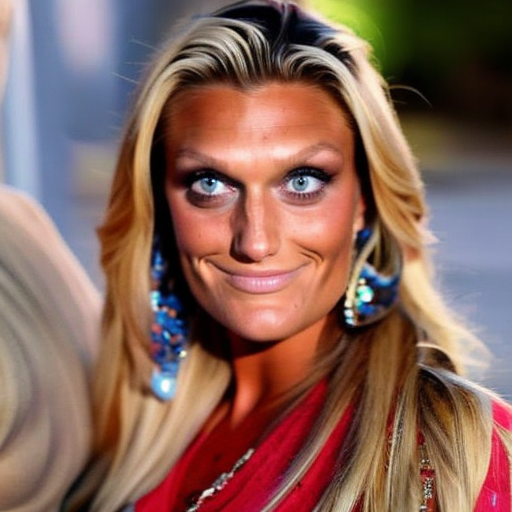

In [63]:
generator = torch.Generator(device=device)
generator = generator.manual_seed(5)
latents = torch.randn(
        (1, pipe.unet.in_channels, 512 // 8, 512 // 8),
        generator = generator,
        device = device
    ).half()

#inference parameters
prompt = "sks person" #"sks person in a hat in a forest"
negative_prompt = "low quality, blurry, unfinished"
guidance_scale = 3.0
ddim_steps = 50
#run inference
image = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
image

## Reconstructed

In [64]:
e = sae.encode(blondes[2])

In [65]:
edited = sae.decode(e.top_acts, e.top_indices)
weights_out = edited

In [66]:
new_weights = deepcopy(base_weights)
start_idx = 0

for key in base_weights.keys():
    shape = base_weights[key].shape
    end_idx = start_idx + torch.prod(torch.tensor(shape)).item()  # Calculate end index
    new_weights[key] = weights_out[start_idx:end_idx].reshape(*shape)
    start_idx = end_idx

In [67]:
pipe.unet.load_state_dict(new_weights, strict = False)
pipe.to(device)
pass


  0%|          | 0/50 [00:00<?, ?it/s]

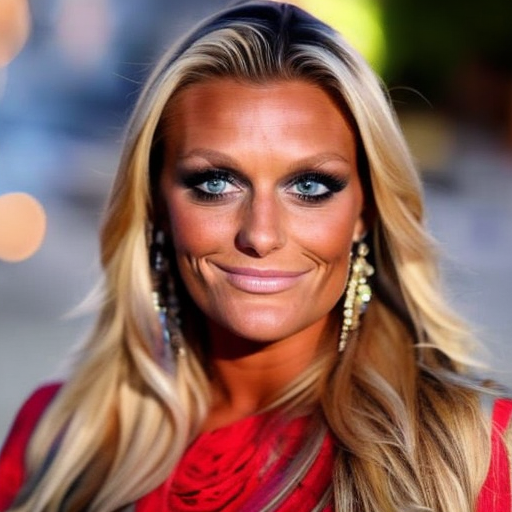

In [68]:
image1 = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
image1

### Reconstruction error

In [69]:
err = {key: adapters_weights1[key].cpu() - new_weights[key].cpu() for key in base_weights}

In [70]:
readded = {key: new_weights[key].cpu() + err[key] for key in new_weights}

In [71]:
pipe.unet.load_state_dict(readded, strict = False)
pipe.to(device)
pass

  0%|          | 0/50 [00:00<?, ?it/s]

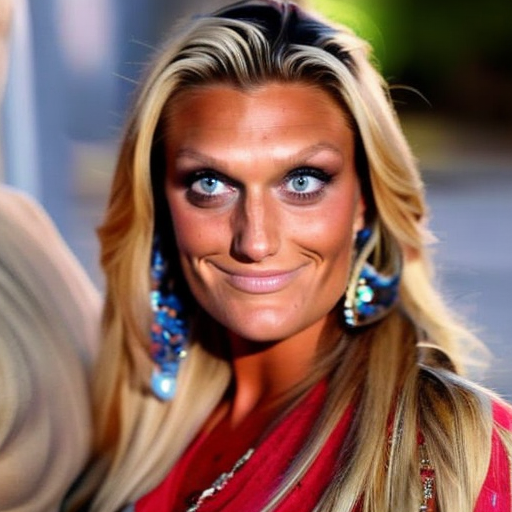

In [72]:
imager = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
imager

## Get scale of feature 434 (strong from the test model)

Since its a feature not activating for this lady lets set the base value as mean of other activations

In [54]:
b = e.top_acts.mean().item()

In [55]:
values = np.linspace(-50*b, 50*b, 7)

In [ ]:
images = []
for v in values:
    e2 = EncoderOutput(top_acts=torch.cat((e.top_acts,torch.tensor([v]).to(device)), 0),
                    top_indices=torch.cat((e.top_indices,torch.tensor([434]).to(device)), 0))
    
    weights_out = sae.decode(e2.top_acts, e2.top_indices)

    new_weights = deepcopy(base_weights)
    start_idx = 0

    for key in base_weights.keys():
        shape = base_weights[key].shape
        end_idx = start_idx + torch.prod(torch.tensor(shape)).item()  # Calculate end index
        new_weights[key] = weights_out[start_idx:end_idx].reshape(*shape)
        start_idx = end_idx
    pipe.unet.load_state_dict(new_weights, strict = False)
    pipe.to(device)
    image1 = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
    images.append(image1)
    

In [ ]:
fig, axes = plt.subplots(1,7, figsize=(35,5))  
for ax, im, v in zip(axes.flatten(), images, values):
    ax.imshow(im)
    ax.axis("off")
    ax.set_title(round(v,1), size=24)
fig.tight_layout()
fig.show()     

## Get scales of activating features

In [21]:
feat_path = sae_path[:-1] + "log_feat_sparsity.pt"
all_features = torch.load(feat_path)

In [ ]:
all_features

tensor([-3.9311, -8.0000, -8.0000,  ..., -2.0173, -2.9031, -2.4445])

In [23]:
# Random feaures that have appropriate log acts
valid_indices = torch.where((all_features >= -5) & (all_features <= -2))[0]
chosen_indices = valid_indices[torch.randperm(len(valid_indices))[:3]]
chosen_indices

tensor([1266, 3871, 1470])

In [24]:
all_features[chosen_indices]

tensor([-3.5631, -2.6301, -3.0965])

In [73]:
acts = sae.pre_acts(blondes[2])

In [74]:
mn = acts[torch.where((acts>0))[0].cpu()].mean().cpu().detach().numpy()

In [75]:
final_indices= torch.tensor([ 274, 1070, 3735, 4107,])# 4349, 4734, 3649, 3852, 1835, 2627])

In [ ]:
final_indices = valid_indices[acts.cpu()[valid_indices] > 0]
final_indices

In [76]:
acts[final_indices]

tensor([0., 0., 0., 0.], device='cuda:0', grad_fn=<IndexBackward0>)

In [ ]:
all_features[final_indices]

In [77]:
means = acts[final_indices][:].cpu().detach()
features = final_indices[:]
means, features

(tensor([0., 0., 0., 0.]), tensor([ 274, 1070, 3735, 4107]))

### Other features

In [ ]:
top3 = e.top_acts.topk(3)
means = top3.values.cpu().detach()
features = e.top_indices[top3.indices].cpu()
means, features

In [ ]:
features = torch.tensor([480, 696, 1214])
means = e.top_acts[torch.isin(e.top_indices.cpu(), features)].cpu().detach()
features, means

In [ ]:
indices = torch.randperm(len(e.top_acts))[:5]
means = e.top_acts[indices].cpu().detach()
features = e.top_indices[indices].cpu()
means, features

## Generate chosen

In [ ]:
for f, m in zip(features, means):
    m = mn if m == 0 else m
    # values = np.linspace(-30*m, 30*m, 7)
    values = np.linspace(-2,2,7)
    images = []
    for v in values:
        e2 = EncoderOutput(top_acts=torch.cat((e.top_acts,torch.tensor([v]).to(device)), 0),
                        top_indices=torch.cat((e.top_indices,torch.tensor([f]).to(device)), 0))
        
        weights_out = sae.decode(e2.top_acts, e2.top_indices)

        new_weights = deepcopy(base_weights)
        start_idx = 0

        for key in base_weights.keys():
            shape = base_weights[key].shape
            end_idx = start_idx + torch.prod(torch.tensor(shape)).item()  # Calculate end index
            new_weights[key] = weights_out[start_idx:end_idx].reshape(*shape)
            start_idx = end_idx
        pipe.unet.load_state_dict(new_weights, strict = False)
        pipe.to(device)
        image1 = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
        images.append(image1)
    fig, axes = plt.subplots(1,7, figsize=(35,5))  
    for ax, im, v in zip(axes.flatten(), images, values):
        ax.imshow(im)
        ax.axis("off")
        ax.set_title(round(v,1), size=24)
    fig.tight_layout()
    fig.show()    
    

### With error trick

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

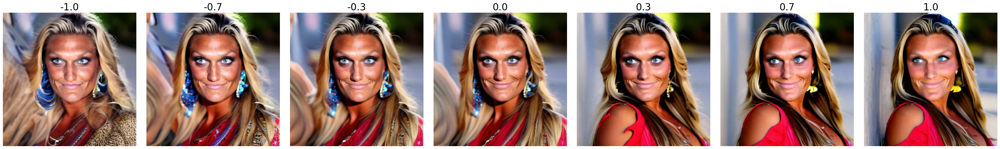

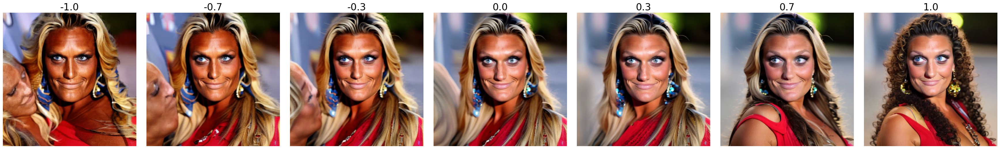

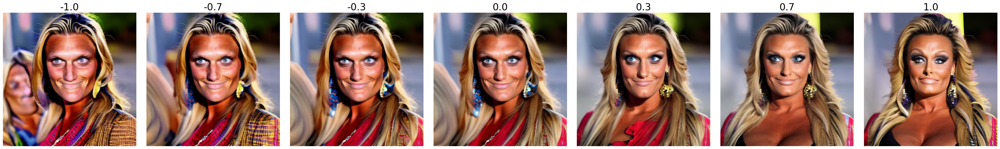

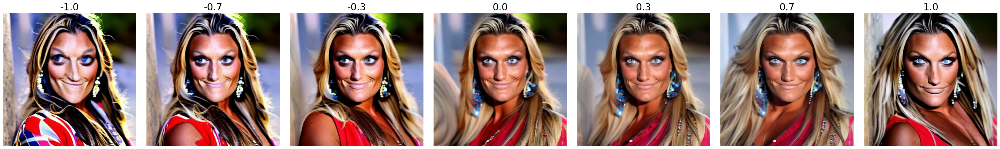

In [78]:
for f, m in zip(features, means):
    m = mn if m == 0 else m
    # values = np.linspace(-30*m, 30*m, 7)
    values = np.linspace(-1,1,7)
    images = []
    for v in values:
        e2 = EncoderOutput(top_acts=torch.cat((e.top_acts,torch.tensor([v]).to(device)), 0),
                        top_indices=torch.cat((e.top_indices,torch.tensor([f]).to(device)), 0))
        
        weights_out = sae.decode(e2.top_acts, e2.top_indices)

        new_weights = deepcopy(base_weights)
        start_idx = 0

        for key in base_weights.keys():
            shape = base_weights[key].shape
            end_idx = start_idx + torch.prod(torch.tensor(shape)).item()  # Calculate end index
            new_weights[key] = weights_out[start_idx:end_idx].reshape(*shape)
            start_idx = end_idx

        new_weights = {key: new_weights[key].cpu() + err[key] for key in new_weights}

        pipe.unet.load_state_dict(new_weights, strict = False)
        pipe.to(device)
        image1 = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents=latents).images[0]
        images.append(image1)

    fig, axes = plt.subplots(1,7, figsize=(35,5))  
    for ax, im, v in zip(axes.flatten(), images, values):
        ax.imshow(im)
        ax.axis("off")
        ax.set_title(round(v,1), size=24)
    fig.tight_layout()
    fig.show()    
    

## Check all features

In [ ]:
images = []
for i in range(100):
    e = sae.encode(blondes[0])
    print(i, len(images))
    for c in (1, -1):
        if i in e.top_indices:
            e.top_acts[i]=c
            edited = sae.decode(e.top_acts, e.top_indices)
        else:
            e2 = EncoderOutput(top_acts=torch.cat((e.top_acts,torch.tensor([c]).to(device)), 0),
                               top_indices=torch.cat((e.top_indices,torch.tensor([i]).to(device)), 0))
            edited = sae.decode(e2.top_acts, e2.top_indices)
        
        weights_out = edited
        new_weights = deepcopy(base_weights)
        start_idx = 0

        for key in base_weights.keys():
            shape = base_weights[key].shape
            end_idx = start_idx + torch.prod(torch.tensor(shape)).item()  # Calculate end index
            new_weights[key] = weights_out[start_idx:end_idx].reshape(*shape)
            start_idx = end_idx
    
        pipe.unet.load_state_dict(new_weights, strict = False)
        pipe.to(device)
        img = pipe(prompt, num_inference_steps=ddim_steps, guidance_scale=guidance_scale,  negative_prompt=negative_prompt, latents = latents ).images[0]
        images.append(img)
    
    
    if (i+1) % 20 == 0:
        fig, axes = plt.subplots(20, 2, figsize=(3,20))  
        for ax, im in zip(axes.flatten(), images):
            ax.imshow(im)
            ax.axis("off")
        fig.tight_layout()
        fig.show()     
        images = []
        break    


## Input scale

In [ ]:
blondes[0].mean()

In [ ]:
blondes.mean(dim=1).mean()

In [ ]:
blondes.mean(dim=1).std()

In [ ]:
blondes.std()

In [17]:
import matplotlib.pyplot as plt

In [ ]:
plt.hist(blondes.flatten().cpu().numpy())

In [ ]:
plt.hist(brunettes.flatten().cpu().numpy())